In [1]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import contextily as ctx

In [161]:
sf_shape = gpd.read_file("data/sf-parcels.shp")

In [162]:
sf_shape.head()

,bldgsqft,blklot,block_num,cie,from_st,landuse,lot_num,mapblklot,med,mips,...,retail,shape_area,shape_leng,st_type,street,to_st,total_uses,visitor,yrbuilt,geometry
0,5460.0,0026013,0026,0.0,838,RESIDENT,013,0026013,0.0,0.0,...,0.0,3864.061762,327.786363,ST,BAY,842,0.0,0.0,1912.0,"POLYGON ((-122.42108 37.80478, -122.42118 37.8..."
1,4500.0,0026014,0026,0.0,844,MIXRES,014,0026014,0.0,3471.0,...,0.0,3361.025351,320.352522,ST,BAY,844,3471.0,0.0,1900.0,"POLYGON ((-122.42118 37.80476, -122.42126 37.8..."
2,5783.0,0026015,0026,0.0,848,RESIDENT,015,0026015,0.0,0.0,...,0.0,3272.033196,319.046088,ST,BAY,850,0.0,0.0,1900.0,"POLYGON ((-122.42126 37.80475, -122.42135 37.8..."
3,3700.0,0026016,0026,0.0,860,RESIDENT,016,0026016,0.0,0.0,...,0.0,4570.767667,279.353002,ST,BAY,862,0.0,0.0,1940.0,"POLYGON ((-122.42135 37.80474, -122.42152 37.8..."
4,4543.0,0026017,0026,0.0,870,RESIDENT,017,0026017,0.0,0.0,...,0.0,5225.823735,294.354339,ST,BAY,872,0.0,0.0,1938.0,"POLYGON ((-122.42153 37.80472, -122.42173 37.8..."


In [163]:
sf_shape.columns

Index(['bldgsqft', 'blklot', 'block_num', 'cie', 'from_st', 'landuse',
       'lot_num', 'mapblklot', 'med', 'mips', 'objectid', 'pdr', 'resunits',
       'retail', 'shape_area', 'shape_leng', 'st_type', 'street', 'to_st',
       'total_uses', 'visitor', 'yrbuilt', 'geometry'],
      dtype='object')

In [164]:
sf_shape["landuse"].unique()

array(['RESIDENT', 'MIXRES', 'VACANT', 'PDR', 'OpenSpace', 'VISITOR',
       'MIPS', 'MIXED', 'RETAIL/ENT', 'CIE', 'MISSING DATA', 'MED',
       'Right of Way'], dtype=object)

The Proposal we're exploring is keeping homeless people away from buildings with certain land uses by a particular distance.

From the article: https://sanfrancisco.cbslocal.com/2020/10/04/oakland-leaders-relocate-homeless-camps/
We see:
* 50 feet from
    * Residential
    * Business
    * Park
* 150 feet from
    * school

50 feet: (`RESIDENT`, `MIXRES`, `PDR`, `VISITOR`, `MIPS`, `RETAIL/ENT`, `OpenSpace`)

In [165]:
sf_schools = pd.read_csv("data/sf-school-locations.csv")
sf_schools.head()

,Campus Name,CCSF Entity,Lower Grade,Upper Grade,Grade Range,Category,Map Label,Lower Age,Upper Age,General Type,...,Campus Address,Supervisor District,County FIPS,County Name,Location 1,Neighborhoods (old),Zip Codes,Fire Prevention Districts,Police Districts,Supervisor Districts
0,"Milk, Harvey Milk Childrens Center",SFUSD,-2,-1,PK,USD PreK,CDC095,3,4,CDC,...,"841 ELLIS ST, SAN FRANCISCO CA 94117",6,6075,SAN FRANCISCO,"CA\n(37.783802, -122.420105)",36,28858,7.0,9.0,9
1,Mckinley Elementary School,SFUSD,0,5,K-5,USD Grades K-5,PS075,5,10,PS,...,"1025 14TH ST, San Francisco, CA 94114",8,6075,SAN FRANCISCO,"CA\n(37.766884, -122.436279)",3,28862,15.0,5.0,5
2,Jewish Community Center San Francisco - Rosenb...,Private,-2,-1,PK,Independent / Private,CDC058,3,4,CDC,...,"325 ARGUELLO BLVD, SAN FRANCISCO, CA 94118",1,6075,SAN FRANCISCO,"CA\n(37.784588, -122.459488)",11,54,11.0,6.0,2
3,Eureka Learning Center,Private,-2,-1,PK,Independent / Private,CDC035,3,4,CDC,...,"464 DIAMOND ST, SAN FRANCISCO, CA 94114",8,6075,SAN FRANCISCO,"CA\n(37.754967, -122.437004)",22,28862,2.0,4.0,5
4,Noriega Early Education School,SFUSD,-2,5,PK-5,USD PreK/TK-5,PS085,3,10,PS,...,"1775 44TH AVE, San Francisco, CA 94122",4,6075,SAN FRANCISCO,"CA\n(37.753834, -122.503654)",35,56,1.0,8.0,3


In [166]:
sf_schools["Location 1"][0]

'CA\n(37.783802, -122.420105)'

In [167]:
sf_shape["st_type"].unique()

array(['ST', None, 'AVE', 'PL', 'BLVD', 'ALY', 'TER', 'LN', 'CT', 'WAY',
       'PLZ', 'ROW', 'DR', 'LOOP', 'HWY', 'WALK', 'CIR', 'HL', 'RD',
       'STWY', 'PARK'], dtype=object)

In [168]:
None in sf_shape["to_st"].unique()

True

In [169]:
import re
from shapely import geometry

latlon_regex = re.compile(r"\(([-]*[\d]+\.[\d]{2,}),[\s]*([-]*[\d]+\.[\d]{2,})\)")
def convert_school_location_to_latlon(location_str):
    match = latlon_regex.findall(location_str)
    if match:
        lat, lon = match[0]
        lat = float(lat)
        lon = float(lon)
        return geometry.Point(lat, lon)
    else:
        return None

street_types = {'ST', 'AVE', 'PL', 'BLVD', 'ALY', 'TER', 'LN', 'CT',
                    'WAY', 'PLZ', 'ROW', 'DR', 'LOOP', 'HWY', 'WALK',
                    'CIR', 'HL', 'RD', 'STWY', 'PARK'}


def parse_address(address):
    """
    (num) (name) (maybe type), SAN FRANCISCO (,) CA (zip)
    841 ELLIS ST, SAN FRANCISCO CA 94117
    123 The EMBARCADERO, SAN FRANCISCO, CA 94123
    840 BROADWAY, SAN FRANCISCO, CA 94133
    """
    
    street_addr, city_zip = address.split(",", maxsplit=1)
    number, street = street_addr.split(maxsplit=1)
    
    split_street = street.rsplit(maxsplit=1)
    street_type = ""
    if split_street[-1] in street_types: # Last element
        street_type = split_street[-1]
    
    street_name = split_street[0]
    zip_code = city_zip.rsplit(maxsplit=1)[1] # Right hand side
    return (number, street_name, street_type, zip_code)
    

def school_func(schools):

    def is_school(parcel):
        for s_addr in schools["Campus Address"]:
            number, street_name, street_type, zip_code = parse_address(s_addr)
            if parcel["from_st"] is None or parcel["to_st"] is None:
                return False
            if int(parcel["from_st"]) <= int(number) <= int(parcel["to_st"]) and street_name == parcel["street"] and street_type == parcel["st_type"]:
                return True

        return False

    return is_school


In [170]:
sf_schools["Location 1"] = gpd.GeoSeries(sf_schools["Location 1"].map(convert_school_location_to_latlon))

In [171]:
sf_shape["is_school"] = sf_shape.apply(school_func(sf_schools), axis=1) # Axis=1 says apply row to the function

In [172]:
sf_shape["geometry"].map()

TypeError: map() missing 1 required positional argument: 'arg'

In [174]:
len(sf_schools)

445

In [175]:
gg_park = sf_shape.loc[sf_shape["objectid"] == 35672]

In [176]:
gg_park.bounds

,minx,miny,maxx,maxy
35696,-122.510845,37.764088,-122.440923,37.774649


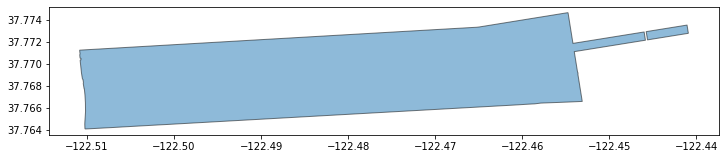

In [177]:
ax = gg_park.plot(figsize=(12, 6), alpha=0.5, edgecolor="k")

In [178]:
gg_park = gg_park.to_crs(epsg=3857)

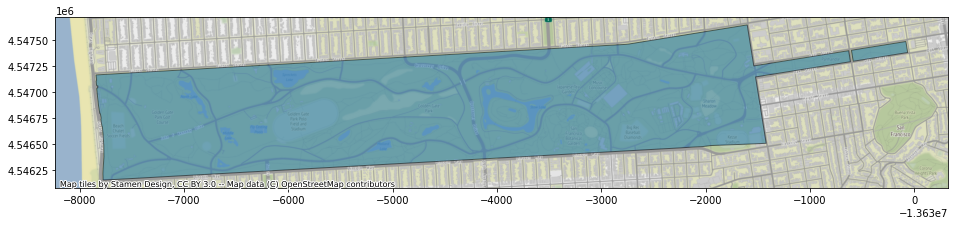

In [179]:
ax = gg_park.plot(figsize=(16, 10), alpha=0.5, edgecolor="k")
ctx.add_basemap(ax)

`(37.762809, -122.494283)` to `(37.763041, -122.488928)` is 471.4 m

In [181]:
gg_park_buffer = gg_park.copy(deep=True)
gg_park_buffer.to_crs(gg_park.crs)

,bldgsqft,blklot,block_num,cie,from_st,landuse,lot_num,mapblklot,med,mips,...,shape_area,shape_leng,st_type,street,to_st,total_uses,visitor,yrbuilt,geometry,is_school
35696,0.0,1700001,1700,34595.0,1101,OpenSpace,001,1700001,0.0,75624.0,...,4.457889e+07,46531.246768,AVE,09TH,1199,145806.0,0.0,0.0,"MULTIPOLYGON (((-13630061.199 4547375.919, -13...",False


In [182]:
gg_park_buff = gg_park_buffer.geometry.buffer(18)
gg_park_buff.area
# buf_ax = gg_park_buffer.plot(figsize=(16, 10), alpha=0.5, edgecolor="k")
# ctx.add_basemap(buf_ax)

35696    6.963346e+06
dtype: float64

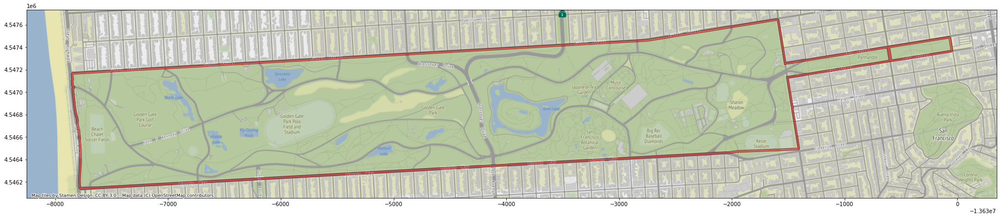

In [183]:
diff_ax = gg_park_buff.difference(gg_park.geometry).plot(figsize=(32, 20), alpha=0.5, color="red", edgecolor="k")
ctx.add_basemap(diff_ax)

In [192]:
forbidden_land_use = ["RESIDENT", "MIXRES", "PDR", "VISITOR", "MIPS", "RETAIL/ENT", "OpenSpace"]
def forbidden_area(parcel):
    """
    Take a parcel and depending on the type of land use (and look for `is_school` for school),
    create a buffer geometry from the parcel geometry, and then diff them with `difference`
    """
    buffer_distance = 0
    if parcel["landuse"] in forbidden_land_use:
        # 50 ft
        buffer_distance = 18.3 # "Meters", except because of the map projection it seems like distances are shorter than real by ~20%
    
    if parcel["is_school"]:
        buffer_distance = 54.9
    
    if buffer_distance == 0:
        return None
    
    buffered_geo = parcel.geometry.buffer(buffer_distance)
    return buffered_geo.difference(parcel.geometry)
    

In [186]:
projected_sf_shape = sf_shape.to_crs(epsg=3857)
projected_sf_shape.crs

<Projected CRS: EPSG:3857>
Name: WGS 84 / Pseudo-Mercator
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: World - 85°S to 85°N
- bounds: (-180.0, -85.06, 180.0, 85.06)
Coordinate Operation:
- name: Popular Visualisation Pseudo-Mercator
- method: Popular Visualisation Pseudo Mercator
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [187]:
# projected_sf_shape.crs
computed_bad_area = gpd.GeoSeries(projected_sf_shape.apply(forbidden_area, axis=1), crs=projected_sf_shape.crs)

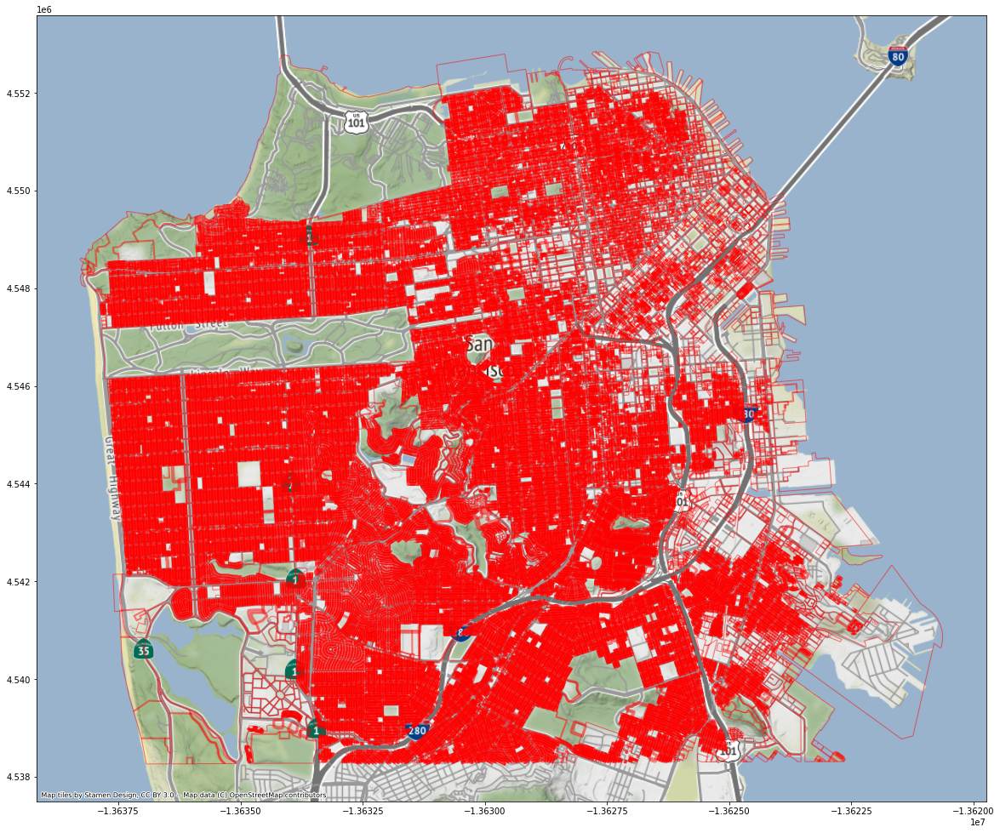

In [190]:
ax_bad = computed_bad_area.plot(figsize=(20, 20), alpha=0.5, color="red")
ctx.add_basemap(ax_bad)

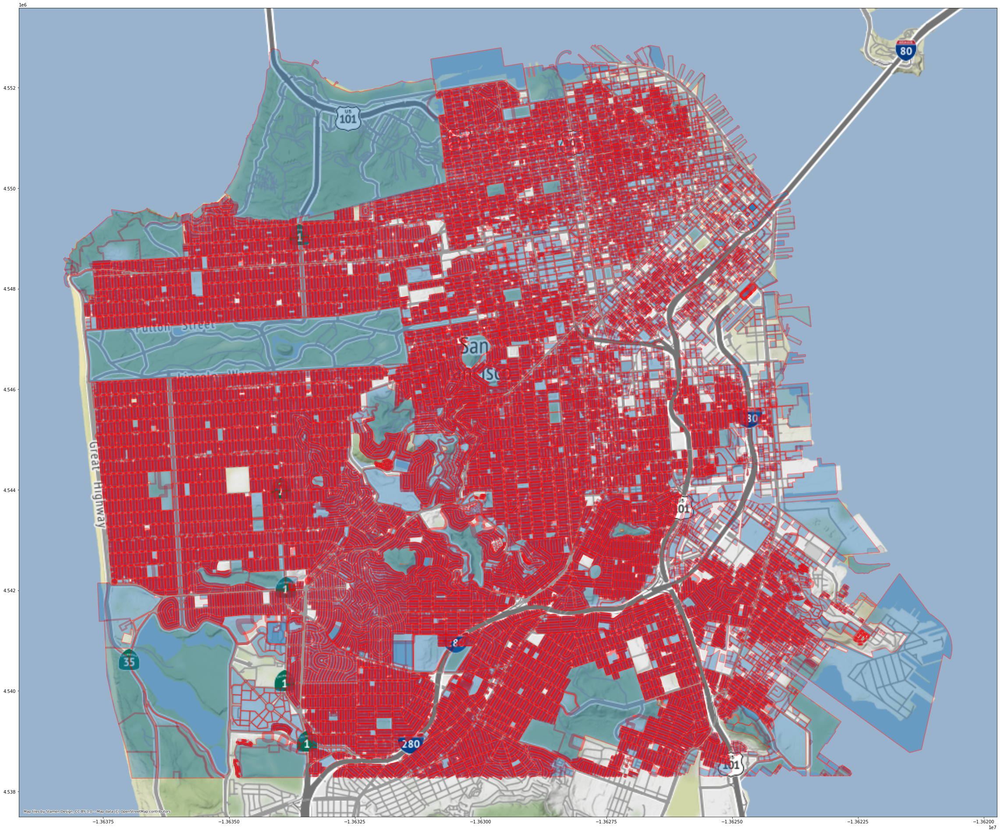

In [219]:
fig, ax = plt.subplots(figsize=(40, 40))
ax.set_aspect("equal")
bad_parcels = projected_sf_shape.loc[projected_sf_shape["landuse"].isin(forbidden_land_use) | projected_sf_shape["is_school"]]
computed_bad_area.plot(ax=ax, figsize=(40, 40), alpha=0.4, color="red")
bad_parcels.plot(ax=ax, figsize=(40, 40), alpha=0.4)
ctx.add_basemap(ax)